In [1]:
import nilearn
import nibabel as nib
from nilearn import image
import pandas as pd
import os
from nilearn import plotting
from nilearn.image import mean_img
import numpy as np
from nilearn import datasets
from matplotlib import pyplot as plt

/home/dell/anaconda3/lib/python3.8/site-packages/nilearn/datasets/__init__.py:86: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  warn("Fetchers from the nilearn.datasets module will be "


In [2]:
a2009s = datasets.fetch_atlas_destrieux_2009(lateralized=True, data_dir=None, url=None, resume=True, verbose=1)
dir(a2009s)

/home/dell/anaconda3/lib/python3.8/site-packages/numpy/lib/npyio.py:2405: VisibleDeprecationWarning: Reading unicode strings without specifying the encoding argument is deprecated. Set the encoding, use None for the system default.
  output = genfromtxt(fname, **kwargs)


['description', 'labels', 'maps']

In [3]:
group_list=['PD_PD','PD_control','PD_Prodromal','PD_SWEDD']
datatype_list=['timeseries','matrix']
DATA_PATH='/home/dell/IDA_data/PD'

In [4]:
def read_file(main_path, group_path,if_print=True):
    groupdir=os.path.join(main_path,group_path)
    filenames=os.listdir(groupdir)
    if if_print==True:
        print('In group: '+group_path)
        print(filenames)
        print(str(len(filenames))+' files')
    return filenames 

In [8]:
filenames=read_file(DATA_PATH,group_list[3])

In group: PD_SWEDD
['3581', '3871', '3573', '3582', '3384', '3820', '3550', '3101', '3326', '3566', '3836']
11 files


In [6]:
def load_image(main_path, group_path,image_name,if_print=True):
    count=0
    file_names=read_file(main_path, group_path,if_print)
    file_path=os.path.join(main_path,group_path)
    images_list=[]
    for file in file_names:
        count+=1
        image_path=os.path.join(file_path,file,image_name)
        image=nib.load(image_path)
        images_list.append(image)
        if if_print==True:
            print(image.shape)
    return images_list,file_names

In [7]:
from nilearn.connectome import ConnectivityMeasure
from nilearn import input_data
# initialize masker objec
masker_a2009s = input_data.NiftiLabelsMasker(labels_img=a2009s.maps,
                                            labels = a2009s.labels,
                               standardize=True,
                               memory='nilearn_cache',
                               verbose=0)

# initialize correlation measure
correlation_measure = ConnectivityMeasure(kind='correlation')

In [15]:
def image_to_timeseries(images_list,masker,if_print=True):
    count=0
    timeseries_lists=[]
    for im in images_list:
        count+=1
        time_series = masker.fit_transform(im)
        if if_print==True:
            print('number: '+ str(count)) 
            print(time_series.shape)
        timeseries_lists.append(time_series)
    return timeseries_lists

In [9]:
def timeseries_to_matrix(time_series_list,cut_point,if_print=True):
    count=0
    matrix_lists=[]
    for series in time_series_list:
        count+=1
        correlation_matrix = correlation_measure.fit_transform([series[cut_point:,:]])[0]
        matrix_lists.append(correlation_matrix)
        if if_print==True:
            print('number: '+ str(count)) 
            print('cut shape: ')
            print(series[cut_point:,:].shape)
    return matrix_lists

In [10]:
def plot_matrix(matrix,figname, degree):
    plt.figure(figsize=(10, 10),num=figname)
    plt.title(figname)
    # Mask out the major diagonal
    np.fill_diagonal(matrix, 0)
    plt.imshow(
        matrix 
        ,interpolation="nearest" 
        ,cmap="RdBu_r"
        ,vmax=degree, vmin=-degree
    )
    plt.colorbar()

In [11]:
def plot_matrix_list(main_path, group_path, imagename, degree, cut_point):
    images,filenames=load_image(main_path, group_path,imagename,if_print=True)
    times=image_to_timeseries(images,masker_a2009s,False)
    matrix=timeseries_to_matrix(times, cut_point,False)
    for mat,name in zip(matrix,filenames):
        plot_matrix(mat,name,degree)
    return matrix,times

In [12]:
def save_data_to_disk(save_path,group,datatype,data):
    save_name='/'+group+'_'+datatype
    data_save_path=save_path+save_name
    np.savez_compressed(data_save_path,a = data,dtype=object)
    return data_save_path

In [13]:
def load_data_from_disk(load_path,group,datatype):
    load_name='/'+group+'_'+datatype+'.npz'
    data_path=load_path+load_name
    print(f'load data from: {data_path}')
    data = np.load(data_path)['a']
    return data

In group: PD_PD
['3605', '3372', '3119', '3332', '3371', '3588', '4011', '3589', '3760', '3593', '3383', '3327', '3552', '3771', '3392', '3592', '3377', '3375', '3120', '3387', '3373', '3802', '3378', '3352', '3787', '3118', '3800', '3380', '3808', '3113', '3830', '3386', '3556', '3116']
34 files
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)


<ipython-input-10-c2f1f4a20524>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10, 10),num=figname)


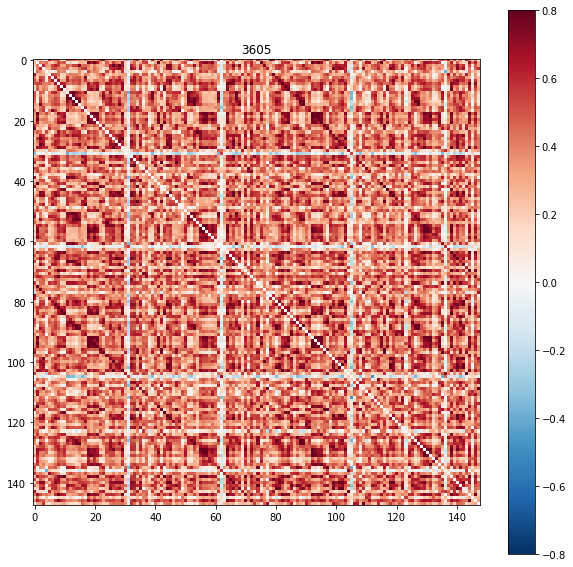

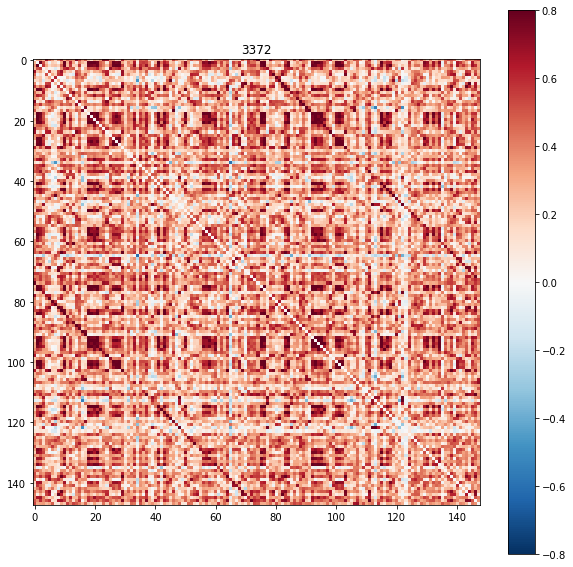

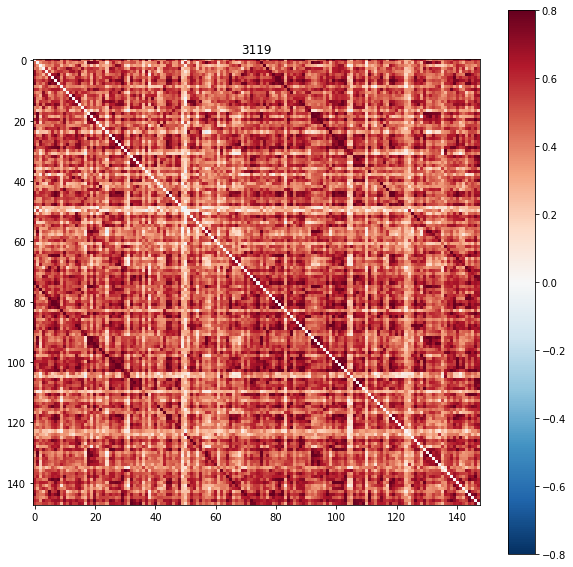

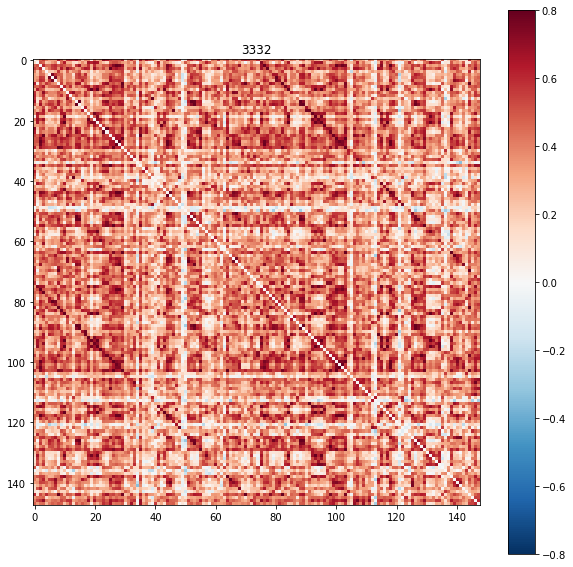

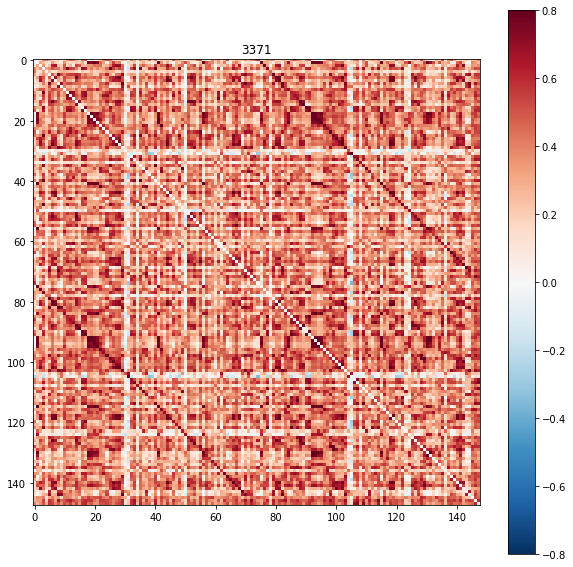

...

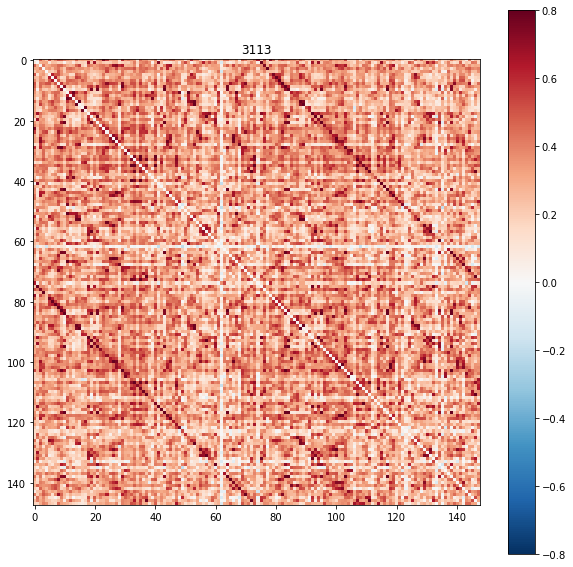

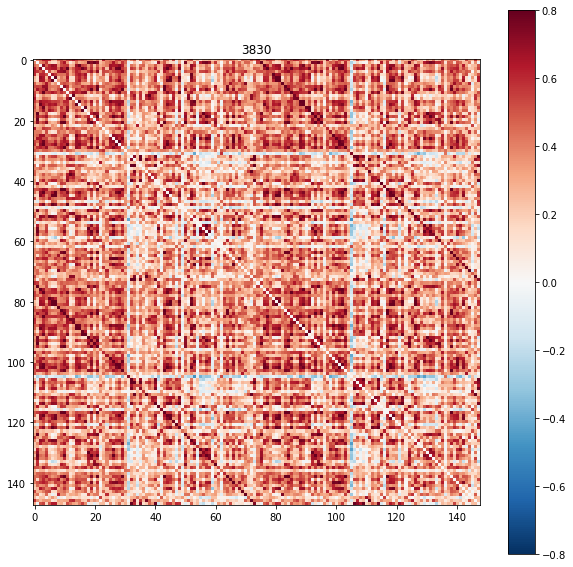

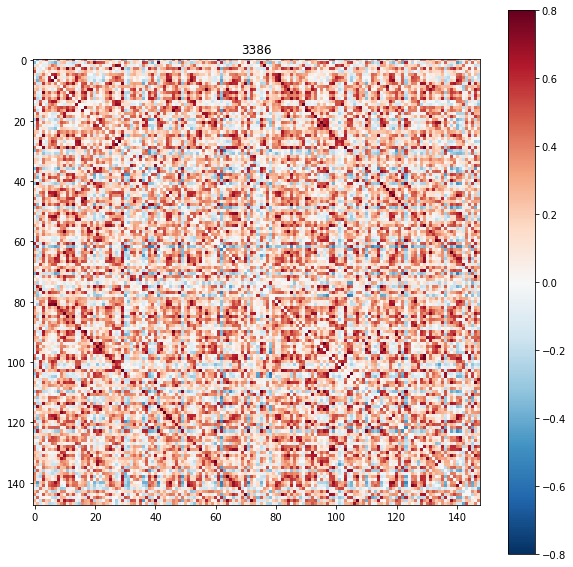

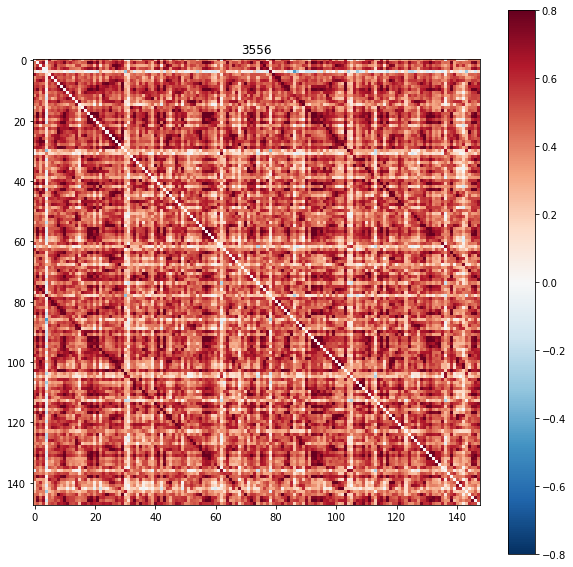

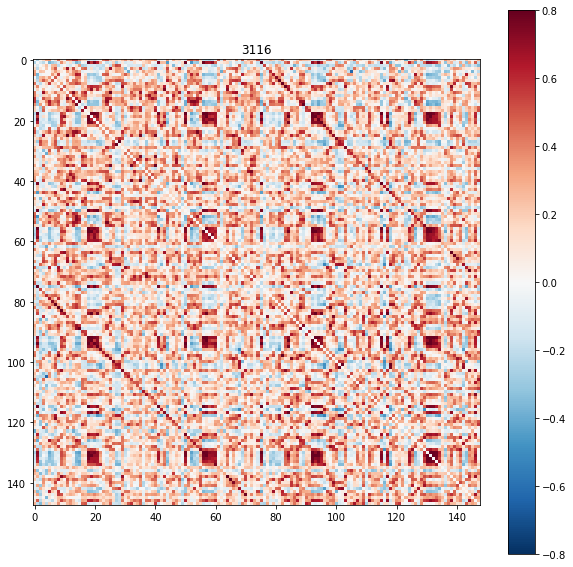

In [21]:
mat_list_PD,times_list_PD=plot_matrix_list(DATA_PATH,group_list[0],'fmri.nii',0.8,10)

In [22]:
print(len(mat_list_PD))
print(len(times_list_PD))

34
34


In group: PD_control
['3351', '3361', '3353', '4018', '4032', '3310', '3571', '3389', '3390', '3779', '3769', '3565', '3369', '3569', '3318']
15 files
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
15
15


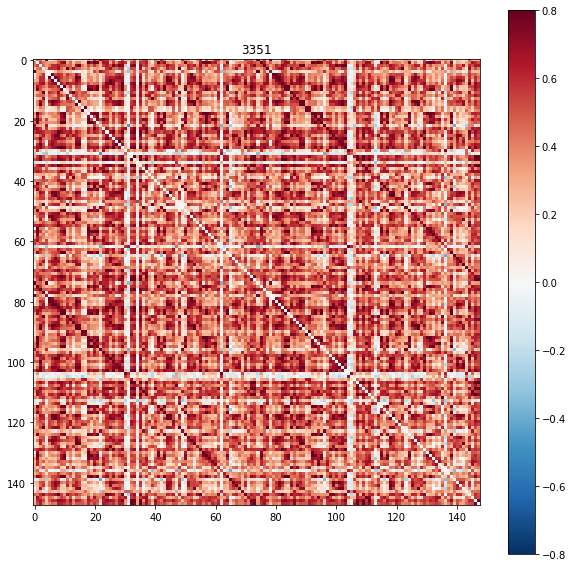

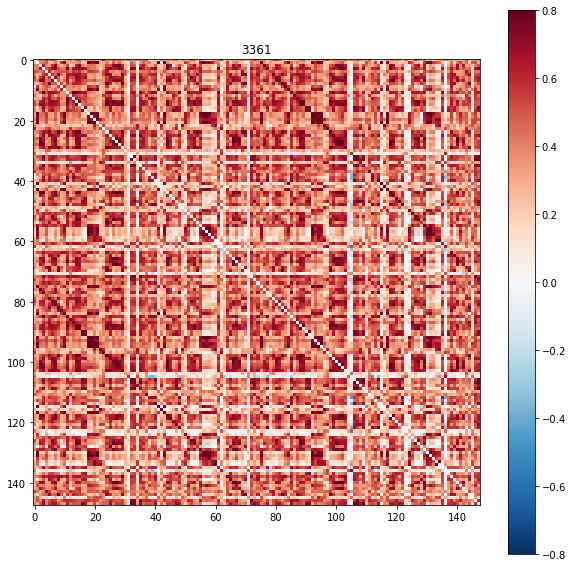

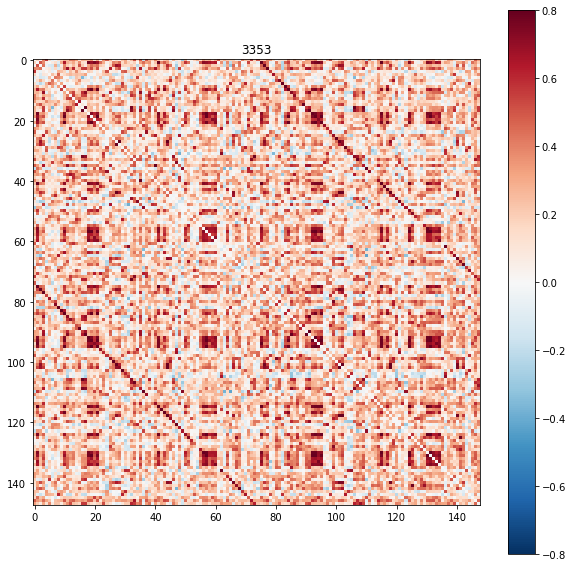

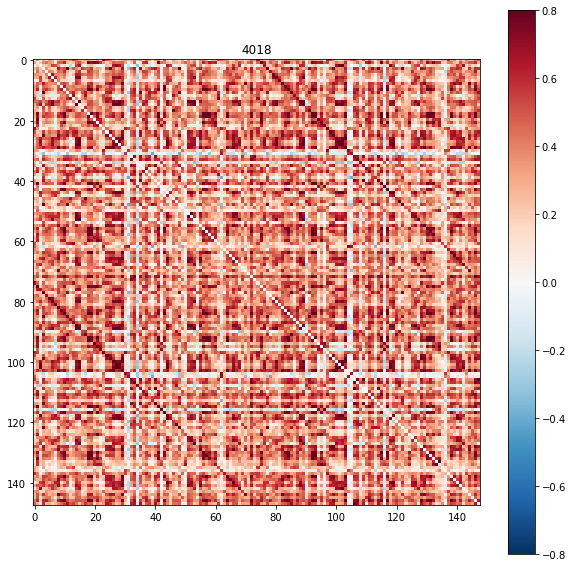

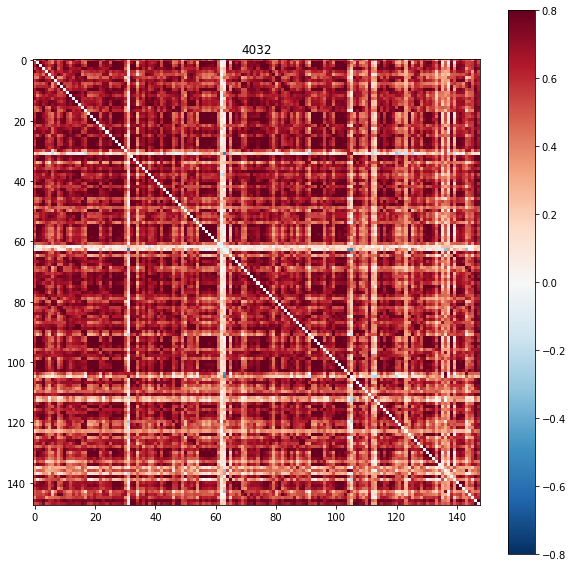

...

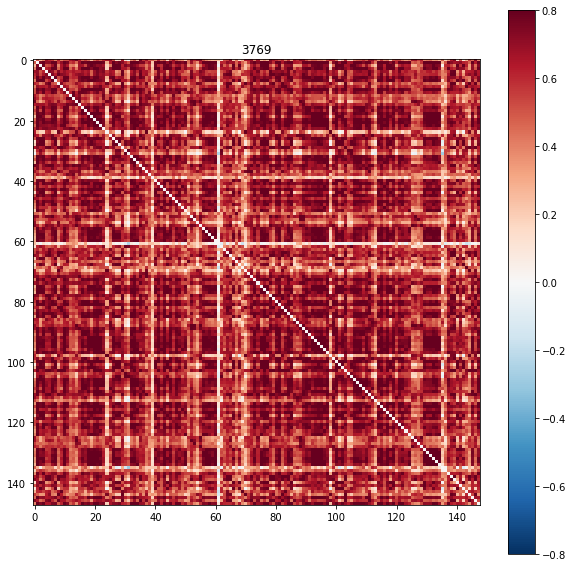

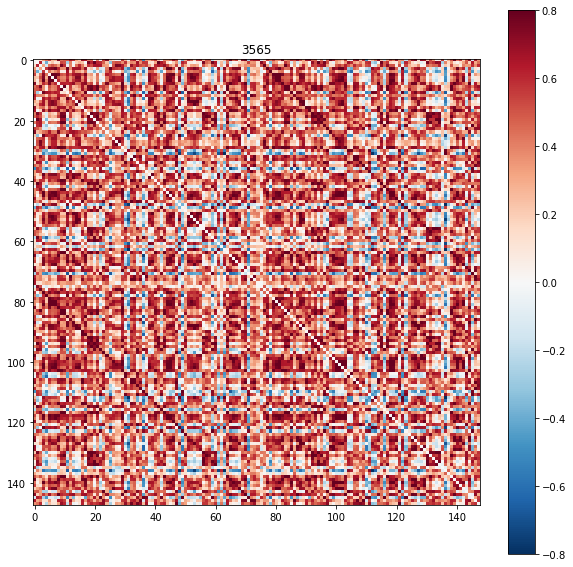

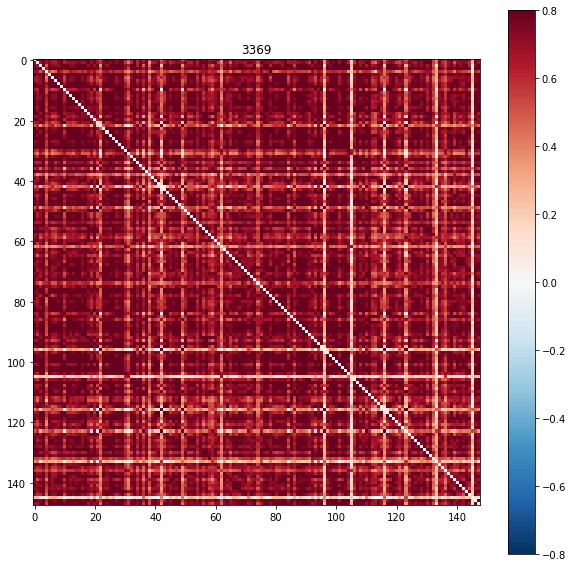

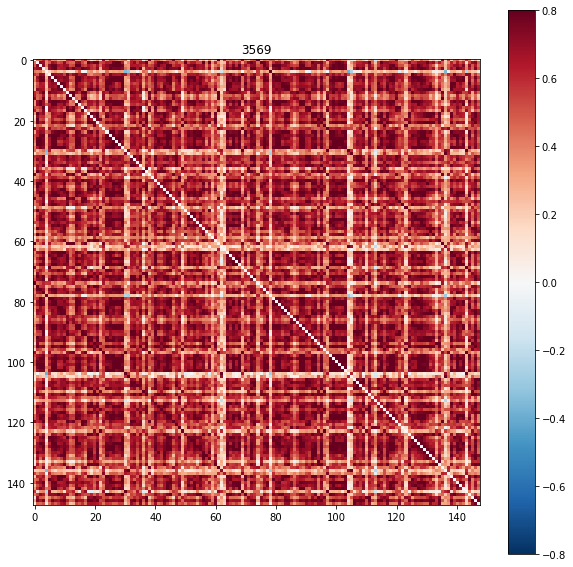

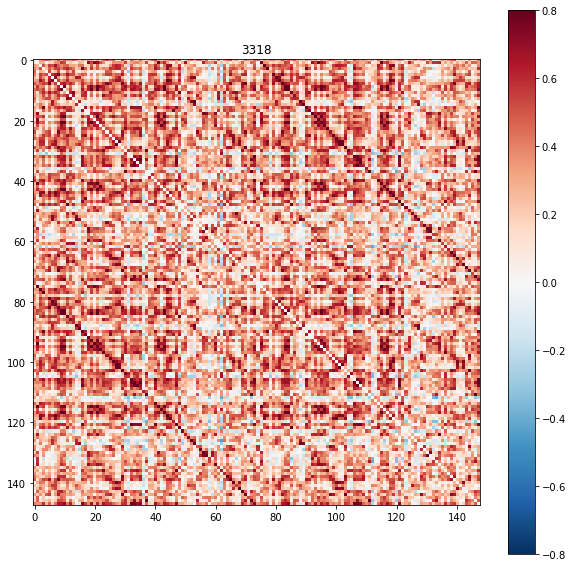

In [23]:
mat_list_Control,times_list_Control=plot_matrix_list(DATA_PATH,group_list[1],'fmri.nii',0.8,10)


In [24]:
print(len(mat_list_Control))
print(len(times_list_Control))

15
15


In group: PD_Prodromal
['60070', '60033', '60036', '60035', '85242', '85236', '60075', '60073', '14426', '60043', '60041', '60044', '16644', '60040', '60074', '60006']
16 files
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)


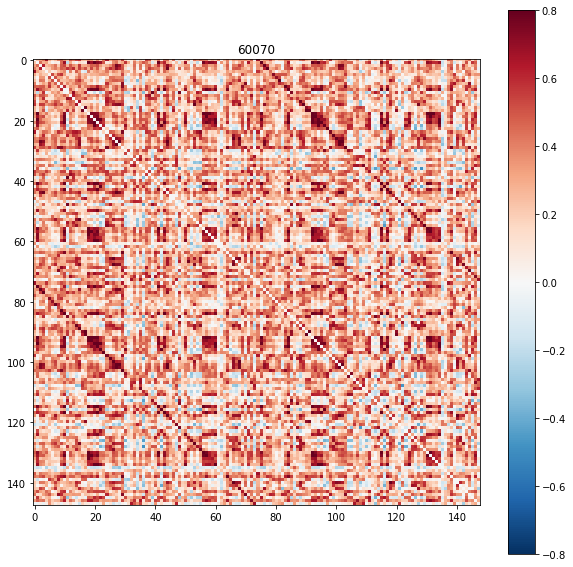

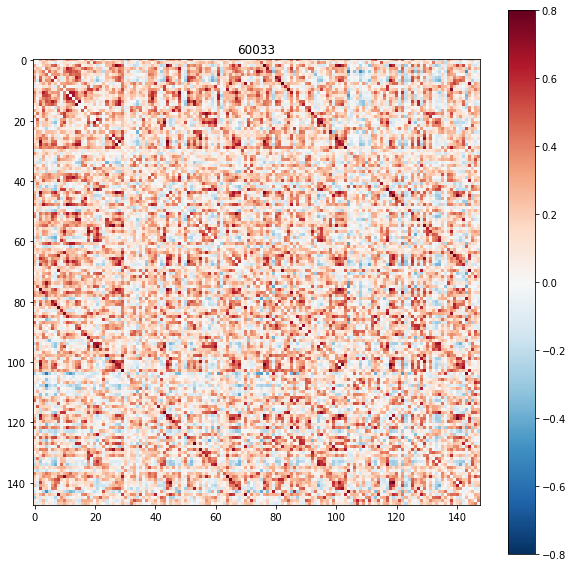

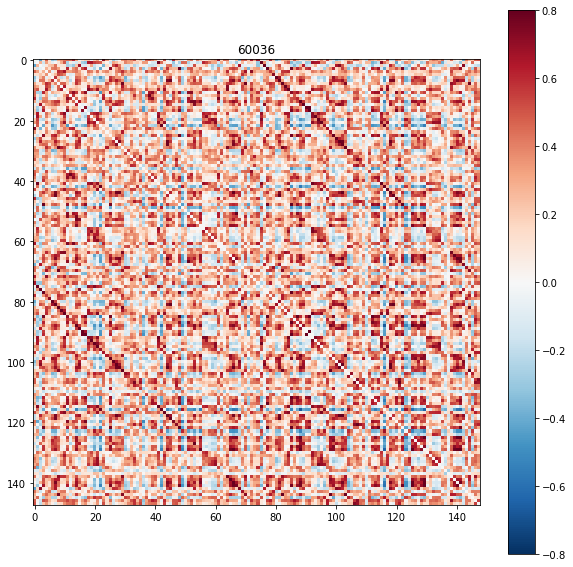

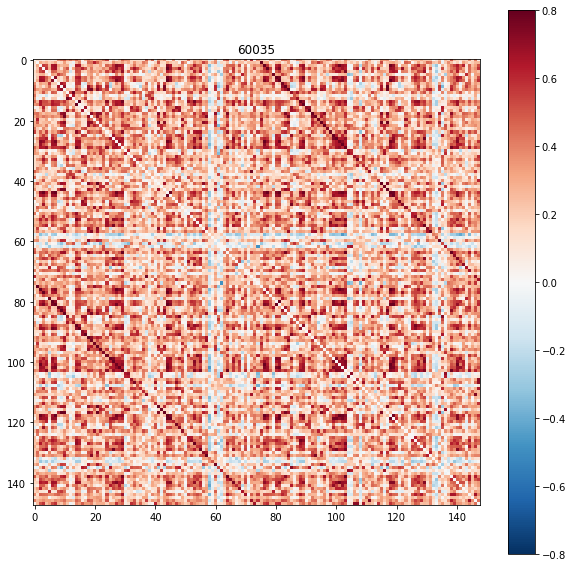

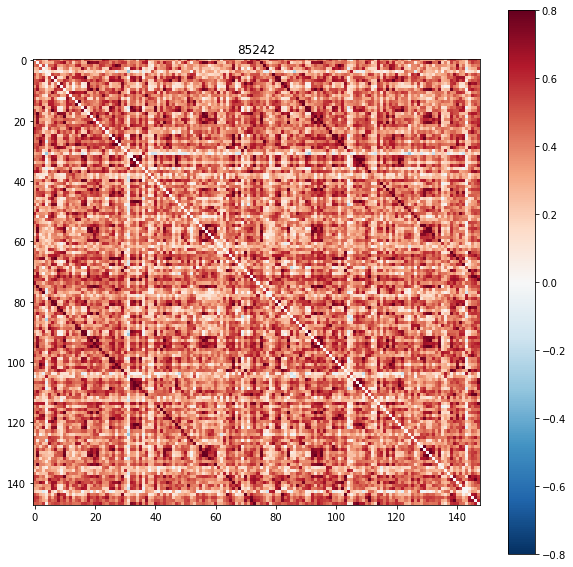

...

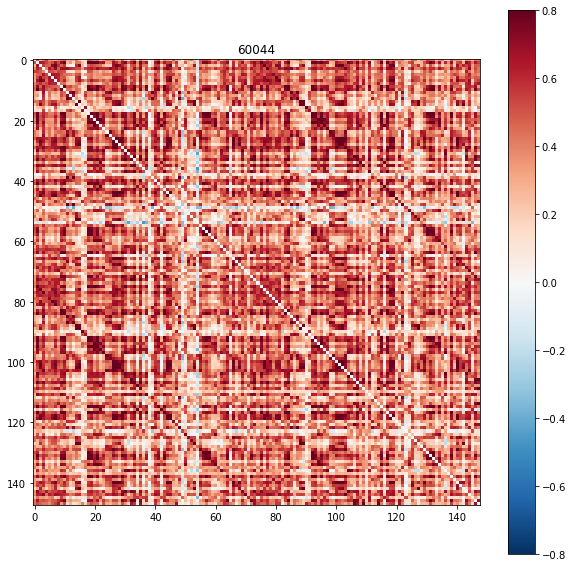

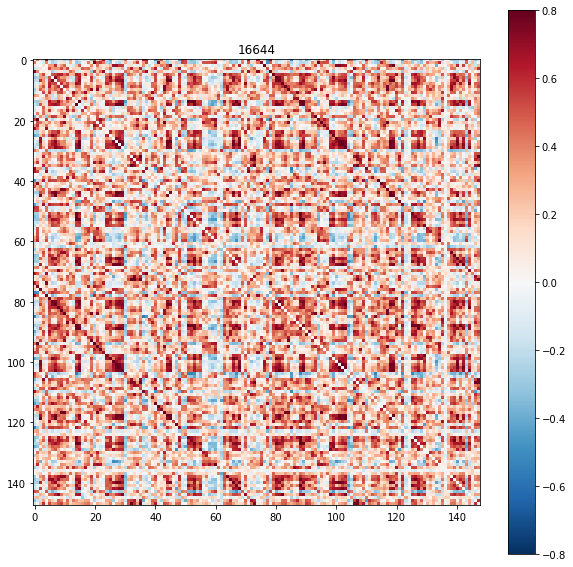

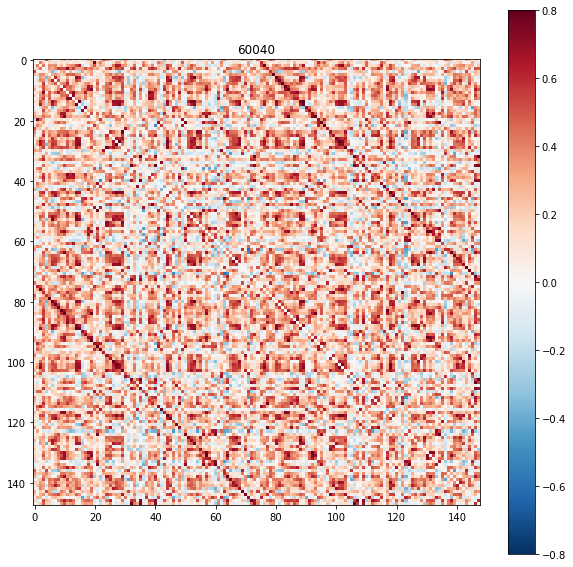

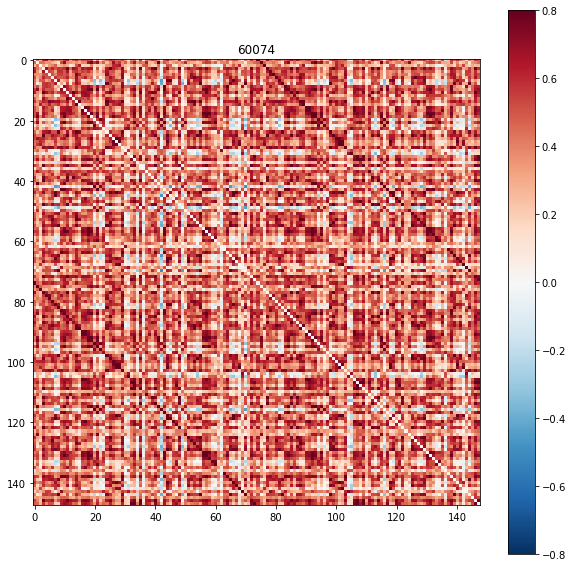

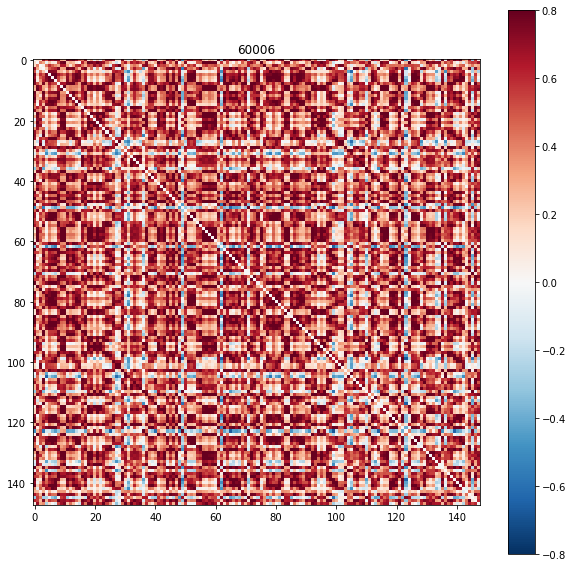

In [26]:
mat_list_Prod,times_list_Prod=plot_matrix_list(DATA_PATH,group_list[2],'fmri.nii',0.8,10)

In [27]:
print(len(mat_list_Prod))
print(len(times_list_Prod))

16
16


In group: PD_SWEDD
['3581', '3871', '3573', '3582', '3384', '3820', '3550', '3101', '3326', '3566', '3836']
11 files
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)
(61, 73, 61, 210)


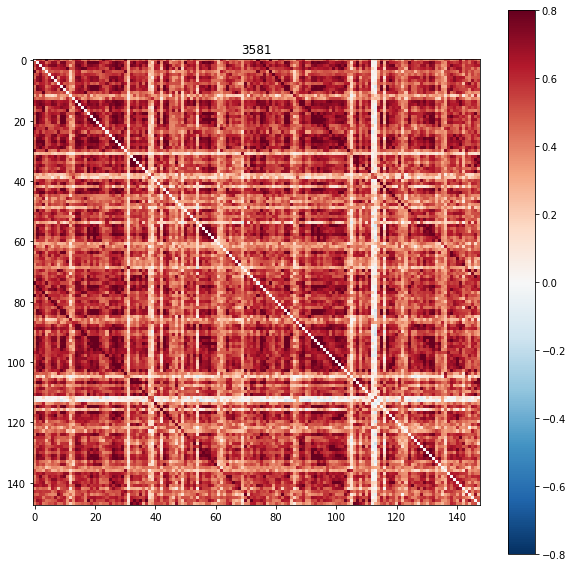

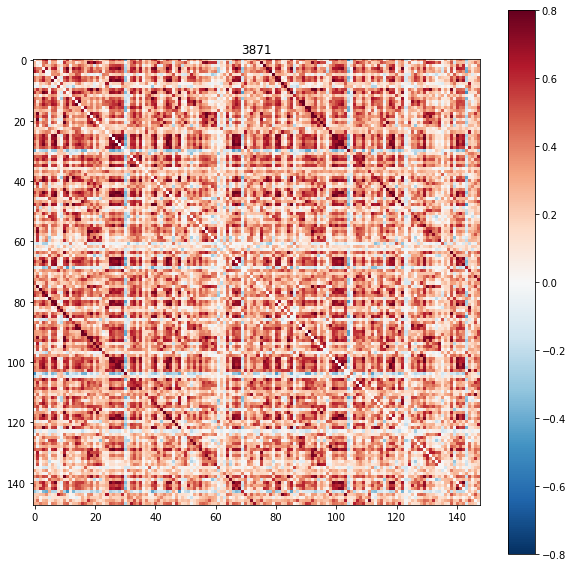

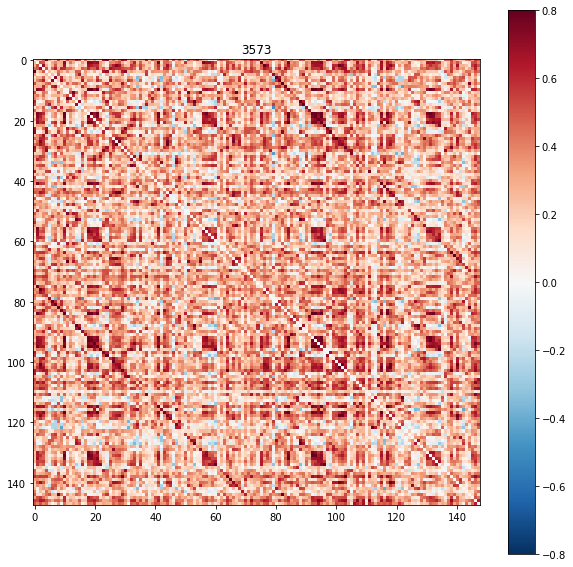

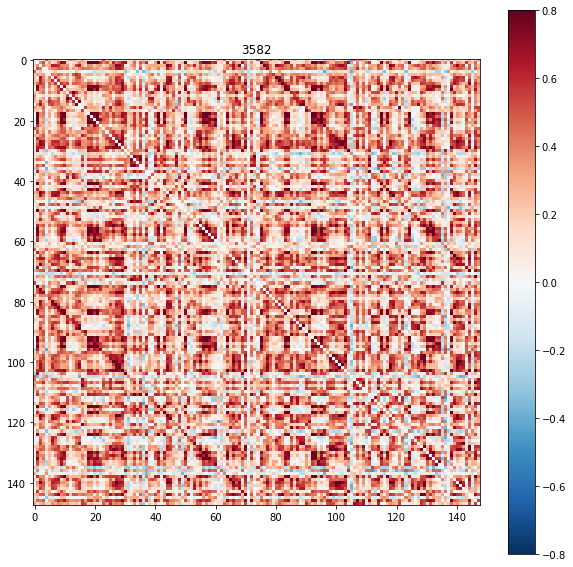

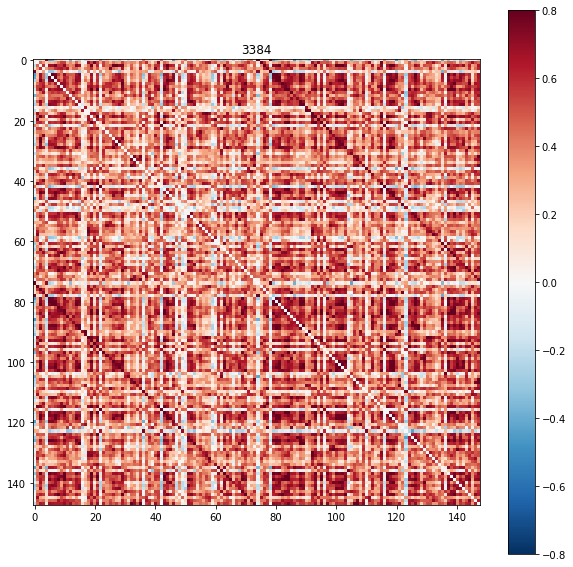

...

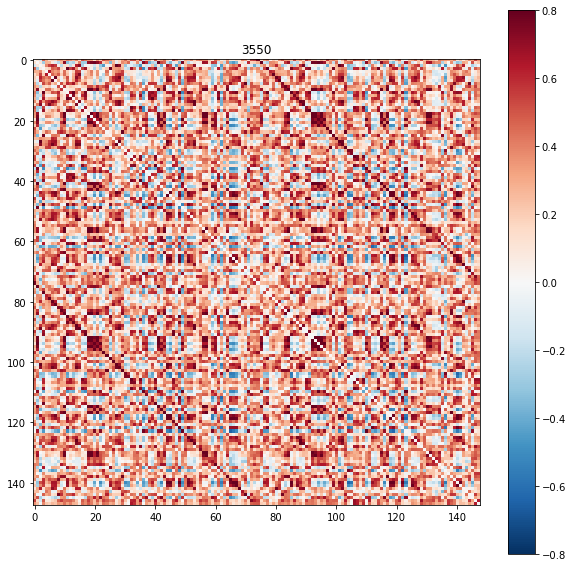

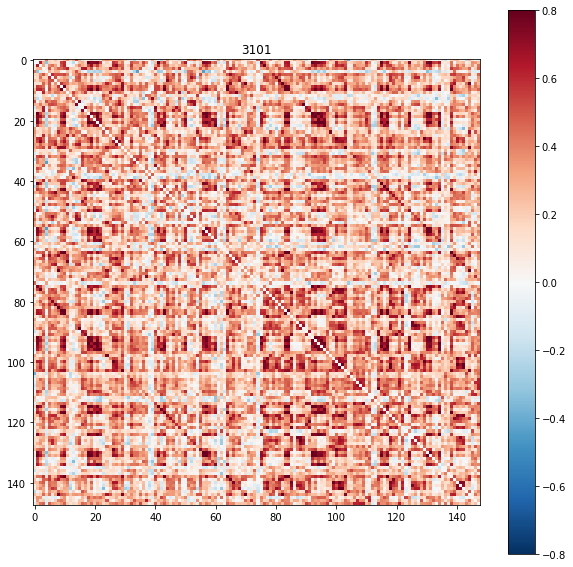

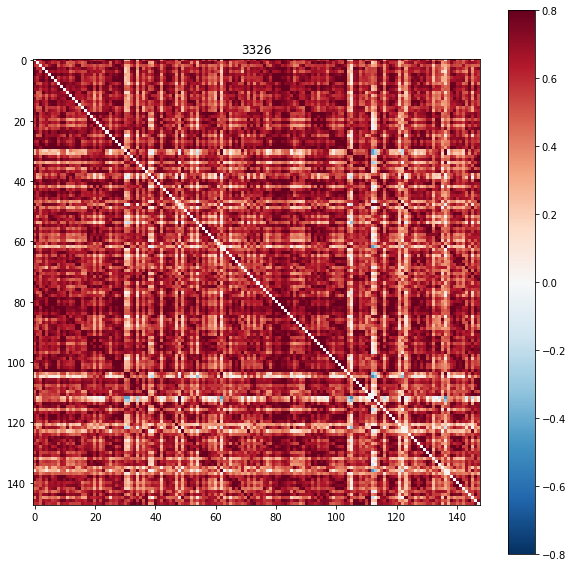

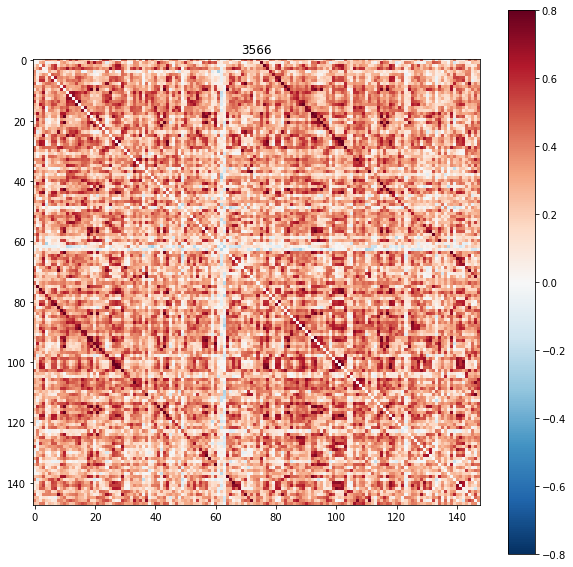

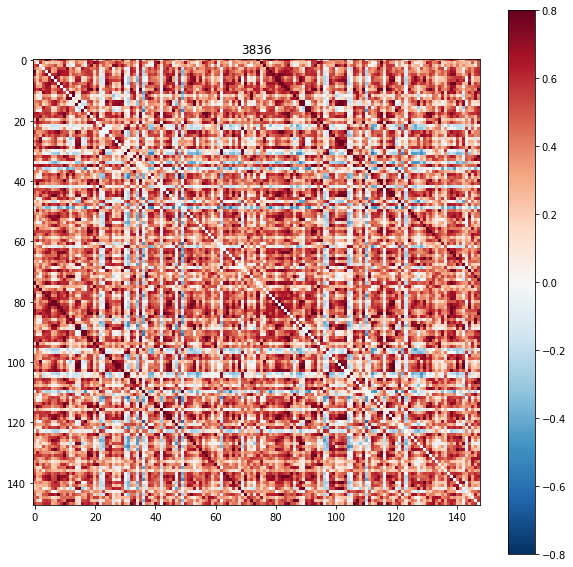

In [29]:
mat_list_SWE,times_list_SWE=plot_matrix_list(DATA_PATH,group_list[3],'fmri.nii',0.8,10)

In [30]:
print(len(mat_list_SWE))
print(len(times_list_SWE))

11
11


In [31]:
data_dir=save_data_to_disk(DATA_PATH,group_list[0],datatype_list[1],mat_list_PD)

In [32]:
data_dir=save_data_to_disk(DATA_PATH,group_list[#data_loaded=load_data(DATA_PATH,groups[3],datatype[1])
#print(data_loaded.shape)1],datatype_list[1],mat_list_Control)

In [33]:
data_dir=save_data_to_disk(DATA_PATH,group_list[2],datatype_list[1],mat_list_Prod)

In [34]:
data_dir=save_data_to_disk(DATA_PATH,group_list[3],datatype_list[1],mat_list_SWE)

In [41]:
data_loaded=load_data_from_disk(DATA_PATH,group_list[3],datatype_list[1])

load data from: /home/dell/IDA_data/PD/PD_SWEDD_matrix.npz


In [42]:
data_loaded.shape

(11, 148, 148)

In [43]:
data_dir=save_data_to_disk(DATA_PATH,group_list[0],datatype_list[0],times_list_PD)
data_dir=save_data_to_disk(DATA_PATH,group_list[1],datatype_list[0],times_list_Control)
data_dir=save_data_to_disk(DATA_PATH,group_list[2],datatype_list[0],times_list_Prod)
data_dir=save_data_to_disk(DATA_PATH,group_list[3],datatype_list[0],times_list_SWE)

In [47]:
data_loaded=load_data_from_disk(DATA_PATH,group_list[3],datatype_list[0])
data_loaded.shape

load data from: /home/dell/IDA_data/PD/PD_SWEDD_timeseries.npz


(11, 210, 148)